# Project: Train a Quadcopter How to Fly

Design an agent to fly a quadcopter, and then train it using a reinforcement learning algorithm of your choice! 

Try to apply the techniques you have learnt, but also feel free to come up with innovative ideas and test them.

## Instructions

Take a look at the files in the directory to better understand the structure of the project. 

- `task.py`: Define your task (environment) in this file.
- `agents/`: Folder containing reinforcement learning agents.
    - `policy_search.py`: A sample agent has been provided here.
    - `agent.py`: Develop your agent here.
- `physics_sim.py`: This file contains the simulator for the quadcopter.  **DO NOT MODIFY THIS FILE**.

For this project, you will define your own task in `task.py`.  Although we have provided a example task to get you started, you are encouraged to change it.  Later in this notebook, you will learn more about how to amend this file.

You will also design a reinforcement learning agent in `agent.py` to complete your chosen task.  

You are welcome to create any additional files to help you to organize your code.  For instance, you may find it useful to define a `model.py` file defining any needed neural network architectures.

## Controlling the Quadcopter

We provide a sample agent in the code cell below to show you how to use the sim to control the quadcopter.  This agent is even simpler than the sample agent that you'll examine (in `agents/policy_search.py`) later in this notebook!

The agent controls the quadcopter by setting the revolutions per second on each of its four rotors.  The provided agent in the `Basic_Agent` class below always selects a random action for each of the four rotors.  These four speeds are returned by the `act` method as a list of four floating-point numbers.  

For this project, the agent that you will implement in `agents/agent.py` will have a far more intelligent method for selecting actions!

In [1]:
import random

class Basic_Agent():
    def __init__(self, task):
        self.task = task
    
    def act(self):
        new_thrust = random.gauss(450., 25.)
        return [new_thrust + random.gauss(0., 1.) for x in range(4)]

Run the code cell below to have the agent select actions to control the quadcopter.  

Feel free to change the provided values of `runtime`, `init_pose`, `init_velocities`, and `init_angle_velocities` below to change the starting conditions of the quadcopter.

The `labels` list below annotates statistics that are saved while running the simulation.  All of this information is saved in a text file `data.txt` and stored in the dictionary `results`.  

In [2]:
%load_ext autoreload
%autoreload 2

import csv
import numpy as np
from task import Task

# Modify the values below to give the quadcopter a different starting position.
runtime = 5.                                     # time limit of the episode
init_pose = np.array([0., 0., 10., 0., 0., 0.])  # initial pose
init_velocities = np.array([0., 0., 0.])         # initial velocities
init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
file_output = 'data.txt'                         # file name for saved results

# Setup
task = Task(init_pose, init_velocities, init_angle_velocities, runtime)
agent = Basic_Agent(task)
done = False
labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4']
results = {x : [] for x in labels}

# Run the simulation, and save the results.
with open(file_output, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(labels)
    while True:
        rotor_speeds = agent.act()
        _, _, done = task.step(rotor_speeds)
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(rotor_speeds)
        for ii in range(len(labels)):
            results[labels[ii]].append(to_write[ii])
        writer.writerow(to_write)
        if done:
            break

Run the code cell below to visualize how the position of the quadcopter evolved during the simulation.

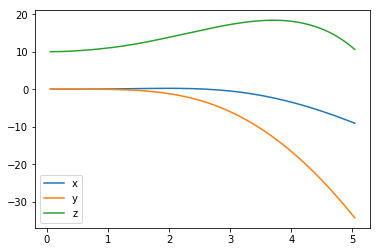

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(results['time'], results['x'], label='x')
plt.plot(results['time'], results['y'], label='y')
plt.plot(results['time'], results['z'], label='z')
plt.legend()
_ = plt.ylim()

The next code cell visualizes the velocity of the quadcopter.

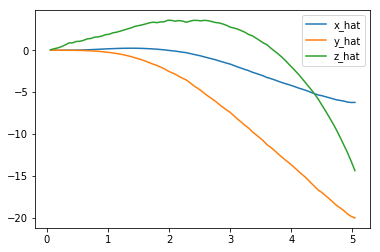

In [4]:
plt.plot(results['time'], results['x_velocity'], label='x_hat')
plt.plot(results['time'], results['y_velocity'], label='y_hat')
plt.plot(results['time'], results['z_velocity'], label='z_hat')
plt.legend()
_ = plt.ylim()

Next, you can plot the Euler angles (the rotation of the quadcopter over the $x$-, $y$-, and $z$-axes),

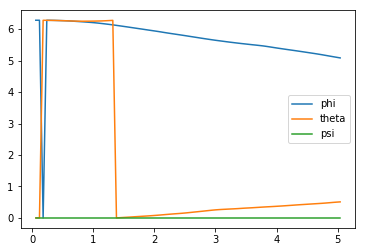

In [5]:
plt.plot(results['time'], results['phi'], label='phi')
plt.plot(results['time'], results['theta'], label='theta')
plt.plot(results['time'], results['psi'], label='psi')
plt.legend()
_ = plt.ylim()

before plotting the velocities (in radians per second) corresponding to each of the Euler angles.

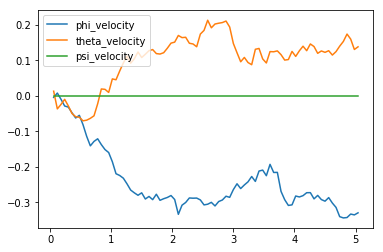

In [6]:
plt.plot(results['time'], results['phi_velocity'], label='phi_velocity')
plt.plot(results['time'], results['theta_velocity'], label='theta_velocity')
plt.plot(results['time'], results['psi_velocity'], label='psi_velocity')
plt.legend()
_ = plt.ylim()

Finally, you can use the code cell below to print the agent's choice of actions.  

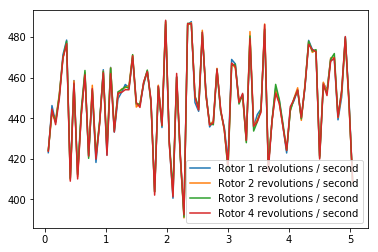

In [7]:
plt.plot(results['time'], results['rotor_speed1'], label='Rotor 1 revolutions / second')
plt.plot(results['time'], results['rotor_speed2'], label='Rotor 2 revolutions / second')
plt.plot(results['time'], results['rotor_speed3'], label='Rotor 3 revolutions / second')
plt.plot(results['time'], results['rotor_speed4'], label='Rotor 4 revolutions / second')
plt.legend()
_ = plt.ylim()

When specifying a task, you will derive the environment state from the simulator.  Run the code cell below to print the values of the following variables at the end of the simulation:
- `task.sim.pose` (the position of the quadcopter in ($x,y,z$) dimensions and the Euler angles),
- `task.sim.v` (the velocity of the quadcopter in ($x,y,z$) dimensions), and
- `task.sim.angular_v` (radians/second for each of the three Euler angles).

In [8]:
# the pose, velocity, and angular velocity of the quadcopter at the end of the episode
print(task.sim.pose)
print(task.sim.v)
print(task.sim.angular_v)

[ -9.07025481 -34.32483576  10.59263824   5.08583792   0.50950715   0.        ]
[ -6.23114328 -20.03202386 -14.38183408]
[-0.32998012  0.13763275  0.        ]


In the sample task in `task.py`, we use the 6-dimensional pose of the quadcopter to construct the state of the environment at each timestep.  However, when amending the task for your purposes, you are welcome to expand the size of the state vector by including the velocity information.  You can use any combination of the pose, velocity, and angular velocity - feel free to tinker here, and construct the state to suit your task.

## The Task

A sample task has been provided for you in `task.py`.  Open this file in a new window now. 

The `__init__()` method is used to initialize several variables that are needed to specify the task.  
- The simulator is initialized as an instance of the `PhysicsSim` class (from `physics_sim.py`).  
- Inspired by the methodology in the original DDPG paper, we make use of action repeats.  For each timestep of the agent, we step the simulation `action_repeats` timesteps.  If you are not familiar with action repeats, please read the **Results** section in [the DDPG paper](https://arxiv.org/abs/1509.02971).
- We set the number of elements in the state vector.  For the sample task, we only work with the 6-dimensional pose information.  To set the size of the state (`state_size`), we must take action repeats into account.  
- The environment will always have a 4-dimensional action space, with one entry for each rotor (`action_size=4`). You can set the minimum (`action_low`) and maximum (`action_high`) values of each entry here.
- The sample task in this provided file is for the agent to reach a target position.  We specify that target position as a variable.

The `reset()` method resets the simulator.  The agent should call this method every time the episode ends.  You can see an example of this in the code cell below.

The `step()` method is perhaps the most important.  It accepts the agent's choice of action `rotor_speeds`, which is used to prepare the next state to pass on to the agent.  Then, the reward is computed from `get_reward()`.  The episode is considered done if the time limit has been exceeded, or the quadcopter has travelled outside of the bounds of the simulation.

In the next section, you will learn how to test the performance of an agent on this task.

## The Agent

The sample agent given in `agents/policy_search.py` uses a very simplistic linear policy to directly compute the action vector as a dot product of the state vector and a matrix of weights. Then, it randomly perturbs the parameters by adding some Gaussian noise, to produce a different policy. Based on the average reward obtained in each episode (`score`), it keeps track of the best set of parameters found so far, how the score is changing, and accordingly tweaks a scaling factor to widen or tighten the noise.

Run the code cell below to see how the agent performs on the sample task.

In [9]:
import sys
import pandas as pd
from agents.policy_search import PolicySearch_Agent
from task import Task

num_episodes = 200
target_pos = np.array([0., 0., 10.])
task = Task(target_pos=target_pos)
agent = PolicySearch_Agent(task) 

for i_episode in range(1, num_episodes+1):
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
        agent.step(reward, done)
        state = next_state
        if done:
            print("\rEpisode = {:4d}, score = {:7.3f} (best = {:7.3f}), noise_scale = {}".format(i_episode, agent.score, agent.best_score, agent.noise_scale), end="")  # [debug]
            break
    sys.stdout.flush()

Episode =  200, score =  -0.480 (best =  -0.298), noise_scale = 3.2625

This agent should perform very poorly on this task.  And that's where you come in!

## Define the Task, Design the Agent, and Train Your Agent!

Amend `task.py` to specify a task of your choosing.  If you're unsure what kind of task to specify, you may like to teach your quadcopter to takeoff, hover in place, land softly, or reach a target pose.  

After specifying your task, use the sample agent in `agents/policy_search.py` as a template to define your own agent in `agents/agent.py`.  You can borrow whatever you need from the sample agent, including ideas on how you might modularize your code (using helper methods like `act()`, `learn()`, `reset_episode()`, etc.).

Note that it is **highly unlikely** that the first agent and task that you specify will learn well.  You will likely have to tweak various hyperparameters and the reward function for your task until you arrive at reasonably good behavior.

As you develop your agent, it's important to keep an eye on how it's performing. Use the code above as inspiration to build in a mechanism to log/save the total rewards obtained in each episode to file.  If the episode rewards are gradually increasing, this is an indication that your agent is learning.

In [10]:
# Hyperparameters
import numpy as np

num_episodes = 1000
runtime = 5.
init = np.array([0.1, 0.1, 10.0, 0., 0., 0.])
target = np.array([50., 50., 100.])
buffer_size = 100000
batch_size = 64
gamma = 0.99
tau = 0.001

exploration_mu = 0.0
exploration_theta = 0.15
exploration_sigma = 0.2

batch_normalization = False

In [11]:
### Train
import sys
from task import Task
from agents.agent import DDPG

my_task = Task(init_pose=init, target_pos=target, runtime=runtime)
my_agent = DDPG(task = my_task, episodes = num_episodes, buffer_size = buffer_size, 
             batch_size = batch_size, gamma = gamma, tau = tau, batch_normalization = batch_normalization)
my_agent.train(verbose = False)

Using TensorFlow backend.
1000: Steps=  84; score= 2.21(best= 70.78); Dist target (final=102.57, best=102.57); Trip= 30.12: 100%|██████████| 1000/1000 [25:01<00:00,  2.85s/it] 


## The top 20 closest flights

Here we present the 20 best flights taking into consideration the proximity to the target during the flight. Then, the plot shows the trajectory of these flights. 

In [12]:
my_agent.get_nsmallest(n = 20)

,episode,timesteps,cumulative_reward,total_distance_traveled,reached_target,closest_distance,closest_x,closest_y,closest_z
908,909,77,35.492437,310.256738,False,36.463377,34.062771,25.110211,121.356052
346,347,84,51.080790,48.471854,False,84.255421,0.478123,42.890965,32.206037
306,307,84,44.781920,44.712772,False,85.227388,-0.908839,38.363711,32.645753
403,404,84,13.793421,96.507068,False,90.708031,-8.682466,9.571377,43.876552
349,350,84,43.222699,28.327489,False,90.986306,-1.115836,12.853648,34.533767
416,417,66,38.287687,72.761516,False,91.167182,29.177911,23.476584,15.298146
278,279,84,65.526935,24.969459,False,91.869094,4.424420,9.612619,31.212964
36,37,84,30.389380,41.530772,False,92.076363,-2.526631,38.086832,25.320109
286,287,84,70.777321,61.808671,False,92.752461,8.637123,60.392515,17.634188
303,304,84,24.122604,45.595188,False,93.345529,-4.322756,42.593927,24.451499


In [13]:
my_agent.plot_nsmallest_3d(n = 20, filename = "plots/plot_nsmallest_3d.html")

## The top 20 highest scores

Here we present the 20 best flights taking into consideration the cumulative reward. I noted that not always the flight that got the closest to target got the highest score. This is somehow expected since the final objective is not stop after passing in the target. The idea is to keep flying close it. Then, the plot shows the trajectory of these flights. 

In [14]:
my_agent.get_nlargest(n = 20)

,episode,timesteps,cumulative_reward,total_distance_traveled,reached_target,closest_distance,closest_x,closest_y,closest_z
286,287,84,70.777321,61.808671,False,92.752461,8.637123,60.392515,17.634188
278,279,84,65.526935,24.969459,False,91.869094,4.424420,9.612619,31.212964
346,347,84,51.080790,48.471854,False,84.255421,0.478123,42.890965,32.206037
306,307,84,44.781920,44.712772,False,85.227388,-0.908839,38.363711,32.645753
349,350,84,43.222699,28.327489,False,90.986306,-1.115836,12.853648,34.533767
581,582,77,42.011744,56.494082,False,95.744669,15.110243,11.871772,19.402328
716,717,65,38.509230,35.754492,False,103.088053,8.096471,9.769708,14.836836
416,417,66,38.287687,72.761516,False,91.167182,29.177911,23.476584,15.298146
908,909,77,35.492437,310.256738,False,36.463377,34.062771,25.110211,121.356052
392,393,68,32.189394,55.580782,False,98.215823,13.296400,28.896945,11.378024


In [15]:
my_agent.plot_nlargest_3d(n = 20, filename = "plots/plot_nlargest_3d.html")

## All flights trajectories

Here we plot all the flights so we can get a sense of what took place during training.

In [16]:
my_agent.plotflight3d_2()

## Plot the Rewards
Once you are satisfied with your performance, plot the episode rewards, either from a single run, or averaged over multiple runs.

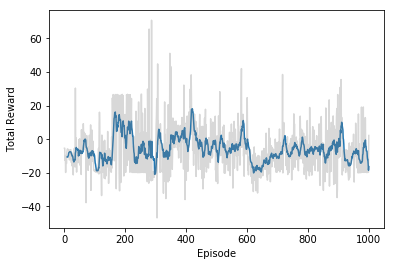

In [17]:
## TODO: Plot the rewards.
my_agent.plot_rewards()

## Reflections

**Question 1**: Describe the task that you specified in `task.py`.  How did you design the reward function?

**Answer**: The idea behind the task I developed was to make the agent to fly towards the target position and once it gets there, keep flying and hover until the episode ends. I also wanted to make it fly as smoothly as possible.
To achieve all this, we derive the reward taking in to consideration the following aspects:

1) Position: Did the agent move forward toward the target or to the opposite direction? How much was?
2) Velocity: The velocity applied was so that the next position was closer to the target? How much was it?
3) Variation in Velocity and Angular Velocity: What was the difference between the linear and angular velocities in two consecutives time steps?

We give points whenever the directions to the flight towards the target were correct but we penalize if they are not. The magnitude of the reward or penalty is given by the mean of the hyperbolic tangent apllied to the distances to target and velocities in wach axis. We applied hyperbolic tangent to normalize the absolute values and to keep them always between 0 and 1. The same calculations are applied to when the directions of the movement is wrong. If the movement of the agent in all axis are correct, extra point is applied. On the other hand, if they are all to the opposite of the target, an extra fine is taken.

Big differences beetween linear and angular velocities are not welcome. We penalize all big percentual differences in angular velocities but tolerate big variations in linear valocities in the beginning of the filght. After some time, we also penalize as we want to encourage smooth movments. Moreover, to encourage fast take off, we apply extra points for Z velocity in correct direction in the first few steps.

In the end we sum everything up applying wheights to the parcels in such a way to address all aspects of the behavior described here.

**Question 2**: Discuss your agent briefly, using the following questions as a guide:

- What learning algorithm(s) did you try? What worked best for you?
- What was your final choice of hyperparameters (such as $\alpha$, $\gamma$, $\epsilon$, etc.)?
- What neural network architecture did you use (if any)? Specify layers, sizes, activation functions, etc.

**Answer**:
I firstly used the PolicySearch_Agent provided by Udacity but just to play around, running it for a couple of times while I was defining my customized task. It was important to get a better sense of how everything worked in this project. We knew this algorithm could not deliver reasonable results to the problem. Then I moved to the Deep Deterministic Policy Gradients (DDPG) using all the model classes provided. I adapted them a little bit in order to get better results but even the original classes delivered nice results.

I applied different values for learning rate (Actor=0.0001, Critic=0.00001), kept discount factor(0.99), size of buffer(100000) but increased batch (128) of memory. These values provided better performances.

I kept the number of layers but increased the number of neurons in them to make the network to learn more complex patterns. The reward function I came up with seemed a little bit complex so more nodes could help the network to understand it better. I stayed with Relu activations but tried sigmoid, batch normalization, regularization, and weight initializers but none of them seemed to help much.

**Question 3**: Using the episode rewards plot, discuss how the agent learned over time.

- Was it an easy task to learn or hard?
- Was there a gradual learning curve, or an aha moment?
- How good was the final performance of the agent? (e.g. mean rewards over the last 10 episodes)

**Answer**:
Not an easy task at all. When I first read the project’s notebook I was afraid not to be able to complete it. My first results did not make much sense. I needed to read all the code in more detail and build functions to actually watch what was happening over the episodes. I spent a lot of time specially in the task and simulation class but also developing a class (named Log) to help me monitor how the agent was performing (saving statistics about the episodes, their timesteps and the whole training itself). Without them I would never finish this task.

No aha moment. There was a long gradual learning I believe. I felt hopeless in many occasions as I could not find solutions for the problems I encountered along the process. I had to be very persistent to carefully analyse hundreds of lines of code to find where the issues were and the best way to solve them.

**Question 4**: Briefly summarize your experience working on this project. You can use the following prompts for ideas.

- What was the hardest part of the project? (e.g. getting started, plotting, specifying the task, etc.)
- Did you find anything interesting in how the quadcopter or your agent behaved?

**Answer**:
I think that there were a number of big challenges in this project. After getting the sense of the overall idea behind the provided code, understand how to evolve it was my first one. I had to invest a lot of time but the task itself was not that complex. A lot more difficult was to define a task to train the agent and then come up with a function to implement the desired behaviour. Not only you have to think about what to reward and penalize but which weights to apply to the positive and negative points that would combine to result in the final reward. There should be a balance between rewards and penalties in such a way that it encouraged the agent accumulate positive points as much as possible. At the same time, the algorithm needed to make it clear when the agent was taking wrong actions by punishing it but not too much, or we would make the agent lazy and not willing to take actions at all, as it would avoid the penalties and represent at least least 0 (zero) as reward. I have tried dozens of functions. Maybe more. However, after many tries I realized that it would be impossible to move forward without actually visualizing the “flights” to deeply understand to where the reward function was driving the agent to go. Therefore, I developed a couple of functions to plot the trajectories in 3D space. First using matplotlib and then using plotly, which provides much more interactive plots and allowed me to navigate through the space. Coding the plot functions itself was a very big challenge, as I had not had previous experience with the libraries.

As far as I understand from the lectures, I expected the agent to always learn in the sucessives episodes. As it is interacting with the environment, it would always gradually improve the total reward. I was surprised this wasn't always the case. The agent sometimes seemd to unlearn and delivered worse results in later episodes. The training were somewhat instable sometimes. Two consecutives executions of the exact same agent with the same paremeters would get bad or good overall results. 